In [2]:
import os, json
import numpy as np
from shapely.geometry import Polygon, shape, Point
from dateutil import parser
from map_parsing import Territory
from tqdm.notebook import tqdm
from datetime import datetime
from drawing_utils import draw_territories, draw_plain, draw_contour
import matplotlib.pyplot as plt

class TimedTerritory(Territory)  :
    def __init__(self, color, polygon, start, end):
        super().__init__( color, polygon)
        assert isinstance(start, datetime)
        assert isinstance(end, datetime)
        self.start=start
        self.end=end
    
    def valid_in(self, date):
        assert isinstance(date, datetime)
        return self.start<= date and self.end > date
    def contemporary_with(self, other):
        assert isinstance(other, TimedTerritory)
        return self.start < other.end and self .end > other.start

def load_timed_territories(filename):
    data = json.load(open(filename, 'r'))
    return [TimedTerritory(datum['color'], shape(datum['polygon']), parser.parse(datum['start']), parser.parse(datum['end'])) for datum in data]

territories =  load_timed_territories(f'../tmp/time_contiguous_territories/all_territories.json')
black = np.zeros((1080,1920,3))

territories_in_1816 = [t for t in territories if t.valid_in(parser.parse('1816-01-01T00:00.000Z'))]

draw_territories(black, (territories_in_1816, 'fill', None))

<Figure size 1440x1280 with 1 Axes>

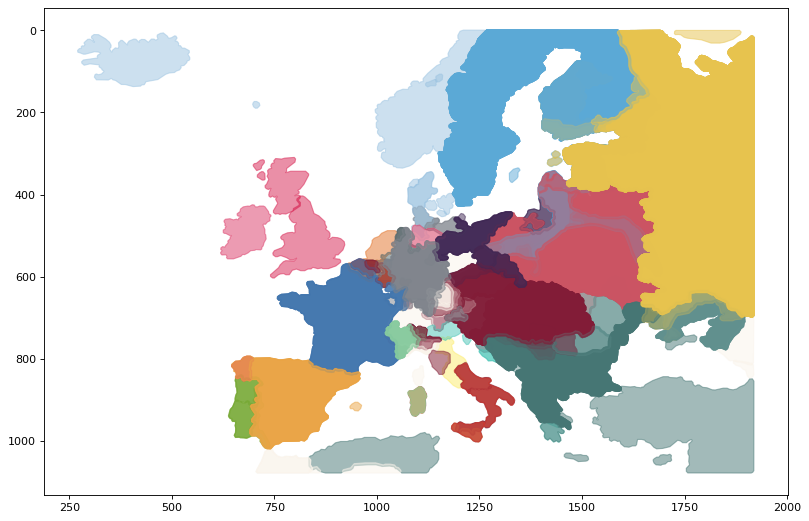

In [74]:
from shapely.geometry import box, LineString
import mpld3
import random
%matplotlib inline
mpld3.enable_notebook()


europe_fat = [TimedTerritory(t.color, t.polygon.buffer(3), t.start, t.end) for t in territories]
for t in europe_fat:
    if len(t.polygon.interiors):
        t.polygon = Polygon(t.polygon.exterior)


    
def _innerDrawPaul(obj, i , color=None, simplify=None):
    try :
        if isinstance(obj, Polygon) or isinstance(obj, LineString):
            if simplify:
                obj=obj.simplify(1)
            color =  color if color is not None else [ 'g', 'r', 'c', 'm', 'y', 'k'][i%6]
        if isinstance(obj, Polygon):
            plt.fill(*obj.exterior.xy, color=color, alpha=.5)
        elif isinstance(obj, LineString):
            if obj.length:
                plt.plot(*obj.xy, color=color)
            else:
                print('did not plot linestring empty')
        elif isinstance(obj, tuple):
            _innerDrawPaul(obj[0], i, obj[1], simplify)
        elif isinstance(obj, Territory):
            _innerDrawPaul(obj.polygon, i, obj.color, simplify)
        elif isinstance(obj, MultiPolygon):
            _innerDrawPaul(GeometryCollection(obj.geoms), color, simplify)
        elif isinstance(obj, Point):
            _innerDrawPaul(obj.buffer(.1), i, color, simplify)
        elif isinstance(obj, MultiPoint):
            _innerDrawPaul(obj.buffer(.1), i, color, simplify)
        elif isinstance(obj, GeometryCollection):
            for sub_object in obj:
                _innerDrawPaul(sub_object, i, color, simplify)
        else:
            raise TypeError(f'Unknown type : {type(obj)}')
    except Exception as e :
        print('Error plotting : ', obj)
        raise e

def drawPaul(*objects, simplify=False):
    ax = plt.figure(figsize=(12, 10), dpi= 80, facecolor='w', edgecolor='k').add_subplot()
    ax.set_aspect(aspect='equal')
    for i, o in tqdm(enumerate(objects),total=len(objects), leave=False):
        _innerDrawPaul(o, i, simplify=simplify)
    plt.gca().invert_yaxis()
    
    plt.show()

drawPaul(*europe_fat[:300], simplify=True)


In [92]:
from shapely.geometry import MultiPolygon, MultiLineString, MultiPoint, Point, GeometryCollection, LinearRing
import shapely.affinity
import shapely.ops
from shapely.errors import TopologicalError
import copy
import shapely.wkt
class IDontUnderstandShapelyError(Exception):
    pass

def middlePoint(pta, ptb):
    pts = np.array([pta.coords, ptb.coords]).reshape((2,2))
    return Point((pts[0]+pts[1])/2)

def is_consistent_middle_point(point, sega, segb, intersection):
    assert isinstance(point, Point)
    assert isinstance(sega, LineString)
    assert isinstance(segb, LineString)
    assert isinstance(intersection, Polygon)
    dista = sega.distance(point)
    distb = segb.distance(point)
    try :
        ratio = min(dista, distb)/(dista+distb)
        if ratio < .4:
            return False
    except ZeroDivisionError:
        pass
    if not point.intersects(intersection):
        return False
    return True
def linkPoints(midA, midB):
    midA = np.array(midA)
    midB=np.array(midB)
    currentPt = midA[0]
    assert all(midA[0]==midB[0])
    
    ia,ib=0,0
    res = []
    while ia < len(midA) and ib < len(midB) :
        if ia==len(midA):
            currentPt = midB[ib]
            ib+=1
        elif ib==len(midB):
            currentPt = midA[ia]
            ia+=1
        else:
            distA = np.linalg.norm(currentPt- midA[ia])
            distB = np.linalg.norm(currentPt- midB[ib])
            if distA <= distB: 
                currentPt = midA[ia]
                ia+=1
            else:
                currentPt = midB[ib]
                ib+=1
        res.append(currentPt)
    res = LineString(res)
    return res

def extend_lineString(to_extend, distance):
    while to_extend.coords[0]==to_extend.coords[1]:
        to_extend = LineString(to_extend.coords[1:])
    while to_extend.coords[-2]==to_extend.coords[-1]:
        to_extend = LineString(to_extend.coords[:-1])
    vector_at_start = np.array(to_extend.coords[1]) - np.array(to_extend.coords[0])
    vector_at_end = np.array(to_extend.coords[-2]) - np.array(to_extend.coords[-1])
    vector_at_start = vector_at_start/ np.linalg.norm(vector_at_start)
    vector_at_end = vector_at_end/ np.linalg.norm(vector_at_end)
    further_start = to_extend.coords[0] - vector_at_start*distance
    further_end = to_extend.coords[-1] - vector_at_end*distance
    res = LineString([further_start]+list(to_extend.coords)+[further_end])
    return res
def get_points_close_each_other(point_group):
    assert isinstance(point_group, MultiPoint)
    for point in point_group:
        close_points = [p for p in point_group if p != point and p.distance(point) < .5]
        if len(close_points):
            return MultiPoint([point] + close_points)

def save_polygons(names, polygons):
    for i, name in enumerate(names):
        with open(f'{name}.wkt', 'w') as f:
            f.write(shapely.wkt.dumps(polygons[i]))
            
def get_extremities_of_intersection(pola, polb, intersection):
    assert isinstance(pola, Polygon)
    assert isinstance(polb, Polygon)
    #intersection is lightly buffered due to precision problems which made it too small  by 1e-13 pt in a few cases
    try :
        extremities = polb.boundary.intersection(pola.boundary).intersection(intersection.buffer(1e-3))
    except ValueError as e:
        print('pola', pola)
        print('polb', polb)
        print('intersection : ', intersection)
        print('buffered intersection : ', intersection.buffer(1e-3))
    except TopologicalError :
        raise IDontUnderstandShapelyError('Cannot compute extremities from countries borders and intersection')
    if isinstance(extremities, Point):
        raise IDontUnderstandShapelyError('Found only one point extremity')
    if isinstance(extremities, GeometryCollection) or isinstance(extremities, MultiLineString) :
        #print('transformed geometry collection to multipoint, initial extremities : ', extremities)
        extremities = GeometryCollection([geom for geom in extremities if (isinstance(geom, Point) or (isinstance(geom, LineString) and geom.length < 1e-10))])
        #print('filtered for linestring and points : ', extremities)
        extremities = MultiPoint([(geom if isinstance(geom, Point) else Point(geom.coords[0])) for geom in extremities ])
        #print('as multipoint : ', extremities)
    if isinstance(extremities, LineString):
        print('extremities is only linestring : ', extremities)
        print('intersection : ', intersection)
        save_polygons(['pola', 'polb', 'intersection'], [pola, polb, intersection])
        raise Exception('extremities is only linestring')
    if len(extremities) < 2:
        #print('Error : only one or zero extremity')
        #print('extremities : ', extremities)
        save_polygons(['polygon_to_cut', 'polb', 'intersection'], [pola, polb, intersection])
        #print('extremities', extremities)
        #drawPaul((pola, 'blue'), (polb, 'red'), (intersection, 'y'), (extremities, 'black'))
        raise IDontUnderstandShapelyError('Error only one extremity')
    # For when there are exactly 3 extremities, assumes 2 of them are very close
    if len(extremities) == 3:
        points_close = get_points_close_each_other(extremities)
        extremities = MultiPoint([pt for pt in extremities if pt != points_close[0]])
    try : 
        assert isinstance(extremities, MultiPoint)
    except AssertionError as e:
        print('Extremities is not multipoint : ', extremities)
        raise e
    if len(extremities) != 2:
        raise IDontUnderstandShapelyError(f'Extremities has length : {len(extremities)}')
    try :
        assert extremities.geoms[0].distance(extremities.geoms[1]) > 1e-10    
    except AssertionError:
        #print('initial extremities : ', polb.boundary.intersection(pola.boundary).intersection(intersection.buffer(1e-10)))
        print('once filtered : ', extremities)
        raise Exception('Extremities are too close together, intersection area : ', intersection.area)
    if not all(extremity.intersects(intersection.boundary) for extremity in extremities):
        for pt in extremities:
            if not pt.intersects(intersection.boundary):
                min_dist = min(pt.distance(Point(bd_point)) for bd_point in intersection.boundary.coords)
                closest = next(Point(bd_coord) for bd_coord in intersection.boundary.coords if Point(bd_coord).distance(pt) == min_dist)
                extremities = MultiPoint([closest] + [extremity for extremity in extremities if extremity != pt] )

    return extremities
'''
Creates two segment facing each other from a linearring split along 2 extremities
The start of the first linear is the same as the second, the ends of both segments are also the same point

'''
def split_polygon_perimeter(intersection_boundary, extremities):
    assert isinstance(extremities, MultiPoint)
    assert len(extremities) is 2
    try : 
        assert isinstance(intersection_boundary, LineString)
    except AssertionError as e :
        if isinstance(intersection_boundary, MultiLineString):
            raise IDontUnderstandShapelyError('Intersection boundary is multilinestring')
    splitted = shapely.ops.split(intersection_boundary, extremities[0])
    if len(splitted) > 2:
        raise Exception(f'splitted is size {len(splitted)}')
    elif len(splitted)==2:
        # Making the line string begin at extremities[0] to get a perfect cut
        splitted = LineString(list(splitted[1].coords) + list(splitted[0].coords))
    else:
        try :
            splitted = splitted[0]
        except IndexError:
            raise IDontUnderstandShapelyError('Could not split polygon perimeter on first cut')
    try :
        splitted = shapely.ops.split(splitted, extremities)
    except ValueError as e :
        print(splitted)
        raise e
    if len(splitted) != 2:
        raise IDontUnderstandShapelyError("Could not split polygon perimeter on second cut")
    ordered = LineString(splitted[1].coords[::-1])
    assert ordered.coords[0] == splitted[0].coords[0]
    # a simplifier sega, segb = splitted0, ordered
    segA, segB = (splitted[0], ordered) if len(splitted[0].coords) > len(ordered.coords) else (ordered, splitted[0])
    return segA, segB

def get_projection_on_segment(source_point, side_to_project):
    return side_to_project.interpolate(side_to_project.project(source_point))
    
def create_midSeg_for_side(side_source, side_to_project, intersection):
    source_coords = np.array(side_source.coords)
    projections =[tuple(get_projection_on_segment(Point(x, y), side_to_project).coords)[0] for (x, y) in source_coords]

    pts_and_projections = np.array(list(zip(source_coords, projections)))
    middle_points = pts_and_projections.sum(axis=1)/2
    res = [(x,y) for (x,y) in middle_points if is_consistent_middle_point(Point(x,y), side_to_project, side_source, intersection)]
    assert res[-1] == side_to_project.coords[-1]
    return LineString(res)
        
def get_regular_segment(segment, step):
    return LineString([segment.interpolate(frac, normalized=True) for frac in np.arange(0,1,step)]+[segment.interpolate(1, normalized=True)])

def compute_border_middle(polygon_to_cut, polb, intersection):
    assert isinstance(polygon_to_cut, Polygon)
    assert isinstance(polb, Polygon)
    assert isinstance(intersection, Polygon)
    extremities = get_extremities_of_intersection(polygon_to_cut, polb, intersection)
    
    segA, segB = split_polygon_perimeter(intersection.boundary, extremities)
    max_length = max([segA.length, segB.length])
    nb_points = max_length*5
    reg_seg_a = get_regular_segment(segA, 1/nb_points)
    reg_seg_b = get_regular_segment(segB, 1/nb_points)
    middle_points = np.array(list(zip(reg_seg_a.coords, reg_seg_b.coords))).sum(axis=1)/2
    drawPaul((segA, 'black'), (segB, 'black'), (reg_seg_a, 'blue'), (reg_seg_b, 'red'), (LineString(middle_points), 'magenta'))
    
    midSegA = create_midSeg_for_side(segA, segB, intersection)
    midSegB = create_midSeg_for_side(segB, segA, intersection)
    

    try :
        assert midSegA.coords[0]==midSegA.coords[0]
        assert midSegA.coords[-1]==midSegB.coords[-1]
    except AssertionError as e:
        save_polygons(['pola', 'polb', 'intersection', 'midSegA', 'midSegB'], [polygon_to_cut, polb, intersection, LineString(midSegA), LineString(midSegB)])
        raise e
    #print('mida', midSegA, 'midb', midSegB)
    #drawPaul((polygon_to_cut, 'blue'), (LineString(midSegA), 'yellow'), (LineString(midSegB), 'red'))
    midSeg = linkPoints(midSegA, midSegB)
    if not midSeg.is_simple:
        if midSegA.is_simple:
            midSeg = midSegA
        elif midSegB.is_simple:
            midSeg=midSegB
        else :
            raise IDontUnderstandShapelyError('Could not elaborate a simple middle segment')
    # if midSeg is not extended it may lay inside the polygon, hence unable to cut it
    midSeg = extend_lineString(midSeg, 1e-3)
    try :
        midSeg = ensure_seg_extremities_out_of_polygon(midSeg, polygon_to_cut)
        return midSeg
    except Exception as e:
        save_polygons(['pola', 'polb', 'intersection', 'midSeg'], [polygon_to_cut, polb, intersection, midSeg])
        raise e

def move_randomly(point, delta):
    return shapely.affinity.translate(point, (2*random.random()-1)*delta, (2*random.random()-1)*delta)

def make_point_exit_polygon(point, polygon):
    for i in range(1000):
        translated = move_randomly(point, 1e-3)
        if not translated.within(polygon):
            return translated
    raise Exception('Point is too far in the polygon to be moved outside')

def ensure_seg_extremities_out_of_polygon(segment, polygon):
    start, end = Point(segment.coords[0]), Point(segment.coords[-1])
    if start.within(polygon):
        #print('start within polytgon')
        #drawPaul((start, 'red'), (polygon, 'blue'), (segment, 'black'))
        start = make_point_exit_polygon(start, polygon)
        segment = LineString([start.coords[0]]+segment.coords[1:])
        #print('made it go out')
        #drawPaul((start, 'red'), (polygon, 'blue'), (segment, 'black'))
    if end.within(polygon):
        #print('end within polygon')
        #drawPaul((end, 'red'), (polygon, 'blue'), (segment, 'black'))
        end = make_point_exit_polygon(end, polygon)
        segment = LineString(segment.coords[:-1]+[end.coords[0]])
        #print('made it go out')
        #drawPaul((end, 'red'), (polygon, 'blue'), (segment, 'black'))
    return segment

def get_polygon_cut_on_border_middle(polygon_to_cut, border_middle):
    assert isinstance(polygon_to_cut, Polygon)
    assert isinstance(border_middle, LineString)
    polygon_split = shapely.ops.split(polygon_to_cut,border_middle)
    #drawPaul((polygon_split[0], 'gray'), (polygon_split[1], 'blue'), (border_middle, 'black'))
    try:
        assert len(polygon_split)>=2
    except AssertionError as e:
        drawPaul((polygon_to_cut, 'blue'), (border_middle, 'black'))
        raise e
    polygon_cut = next(part for part in polygon_split if part.area==max([pol.area for pol in polygon_split]))
    assert polygon_cut.area==max([pol.area for pol in polygon_split])
    return polygon_cut

def get_biggest_polygon(geometry_collection, secure=True):
    to_remove = []
    #print('input collection : ',[f'{type(geom)}, length : {geom.length}' for geom in geometry_collection])
    areas = [pol.area for pol in geometry_collection.geoms if isinstance(pol, Polygon)]
    res = next(pol for pol in geometry_collection.geoms if isinstance(pol, Polygon) and pol.area==max(areas))
    if secure:
        try :
            assert res.area > .99 * sum(areas)
        except AssertionError as e:
            raise IDontUnderstandShapelyError('Polygon retrieved from noisy collection is less than 99% of total surface')
    return res

def cut_out_territory_of_intersection_if_biggest(to_be_reduced_polygon, intersection, conflicting_polygon):
    if to_be_reduced_polygon.area > conflicting_polygon.area : 
        to_be_reduced_polygon = to_be_reduced_polygon.difference(intersection)
        if not isinstance(to_be_reduced_polygon, Polygon):
            to_be_reduced_polygon = get_biggest_polygon(to_be_reduced_polygon)
    assert isinstance(to_be_reduced_polygon, Polygon)
    return to_be_reduced_polygon

def geometry_to_polygon_list(obj):
    if isinstance(obj, Polygon):
        return [obj]
    elif hasattr(obj, 'geoms'):
        return [o for o in obj if isinstance(o, Polygon)]
    elif isinstance(obj, LineString) or isinstance(obj, Point):
        return []
    else:
        raise TypeError(f'Unhandled type : {type(obj)}')
    

def reduce_conflict_by_middle_border(to_be_reduced_polygon, conflicting_polygon, errors_list, logs):
    assert isinstance(to_be_reduced_polygon, Polygon)
    assert isinstance(conflicting_polygon, Polygon)
    #drawPaul((to_be_reduced_polygon, 'blue'), (conflicting_polygon, 'red'))
    try :
        intersections = to_be_reduced_polygon.intersection(conflicting_polygon)
    except TopologicalError as e :
        to_be_reduced_polygon = to_be_reduced_polygon.buffer(-1e-3)
        conflicting_polygon = conflicting_polygon.buffer(-1e-3)
        intersections = to_be_reduced_polygon.intersection(conflicting_polygon)
    for intersection in geometry_to_polygon_list(intersections):
        logs['intersections_generated']+=1
        if intersection.area < 1:
            #cutting out the biggest country
            to_be_reduced_polygon = cut_out_territory_of_intersection_if_biggest(to_be_reduced_polygon, intersection, conflicting_polygon)
            logs['intersections_too_small']+=1
        else :
            try:
                logs['border_middle_tried']+=1
                border_middle = compute_border_middle(to_be_reduced_polygon, conflicting_polygon, intersection)
                to_be_reduced_polygon = get_polygon_cut_on_border_middle(to_be_reduced_polygon, border_middle)
                logs['border_middle_success']+=1
            except IDontUnderstandShapelyError as e:
                errors_list.append({
                    'message' : str(e),
                    'to_be_reduced_polygon' : to_be_reduced_polygon.wkt,
                    'conflicting_polygon' : conflicting_polygon.wkt,
                    'intersection' : intersection.wkt
                })
                logs['border_middle_failed']+=1
                to_be_reduced_polygon = cut_out_territory_of_intersection_if_biggest(to_be_reduced_polygon, intersection, conflicting_polygon)
    return to_be_reduced_polygon

def reduce_territory(dilated_territory, other_dilated_territories, already_reduced_territories, errors_list, logs):
    conflicting_territories = [t for t in other_dilated_territories if t.polygon.intersects(dilated_territory.polygon)]
    if conflicting_territories and False:
        drawPaul(dilated_territory, *conflicting_territories)
    for conflict in tqdm(conflicting_territories, leave=False):
        if conflict in already_reduced_territories:
            dilated_territory.polygon = dilated_territory.polygon.difference(conflict.polygon)
            # The difference may create some tiny geoms which should be ignored
            if not isinstance(dilated_territory.polygon, Polygon):
                try :
                    dilated_territory.polygon = get_biggest_polygon(dilated_territory.polygon)
                except IDontUnderstandShapelyError as e:
                    logs['get_biggest_polygon_unsecure']+=1
                    dilated_territory.polygon = get_biggest_polygon(dilated_territory.polygon, secure=False)
                    errors_list.append({
                        'message' : str(e),
                        'dilated_territory_polygon' : dilated_territory.polygon.wkt,
                        'territory_already_reduced_polygon' :conflict.polygon.wkt,
                    })

        else:
            try:
                dilated_territory.polygon = reduce_conflict_by_middle_border(dilated_territory.polygon, conflict.polygon, errors_list, logs)
            except Exception as e:
                drawPaul(dilated_territory, conflict)
                raise e
    dilated_territory.polygon = dilated_territory.polygon.buffer(-1e-3)

def remove_contained_territories(dilated_territories):
    return [terr for terr in dilated_territories 
            if not any(t.polygon.contains(terr.polygon) for t in 
                       [other for other in dilated_territories if other != terr and other.contemporary_with(terr)])]
from time import time
def solve_border_conflicts(dilated_territories, errors_list, logs):
    init_size = len(dilated_territories)
    dilated_territories = remove_contained_territories(copy.deepcopy(dilated_territories))
    print(f'removed {init_size - len(dilated_territories)} that were contained')
    handled_territories = []
    for territory in tqdm(dilated_territories[0:]):
        other_dilated = [t for t in dilated_territories if t != territory and territory.contemporary_with(t)]
        reduce_territory(territory, other_dilated, handled_territories, errors_list, logs)
        handled_territories.append(territory)
    return handled_territories


The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler
removed 14 that were contained


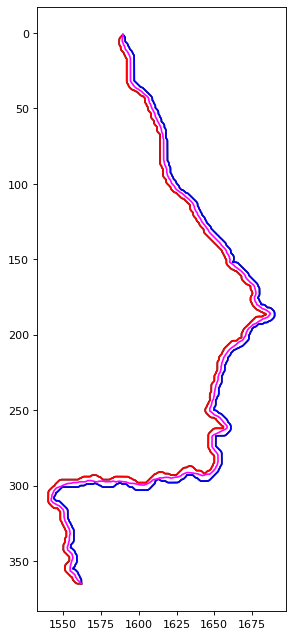

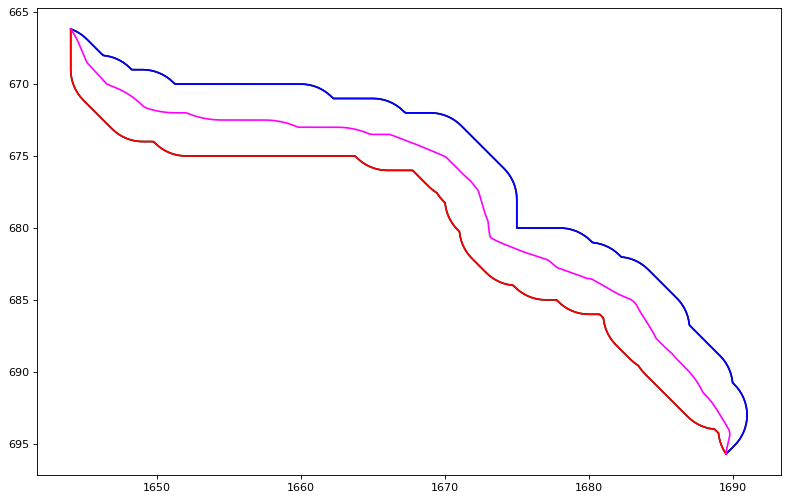

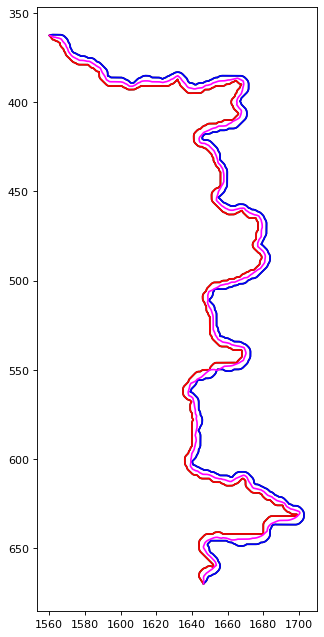

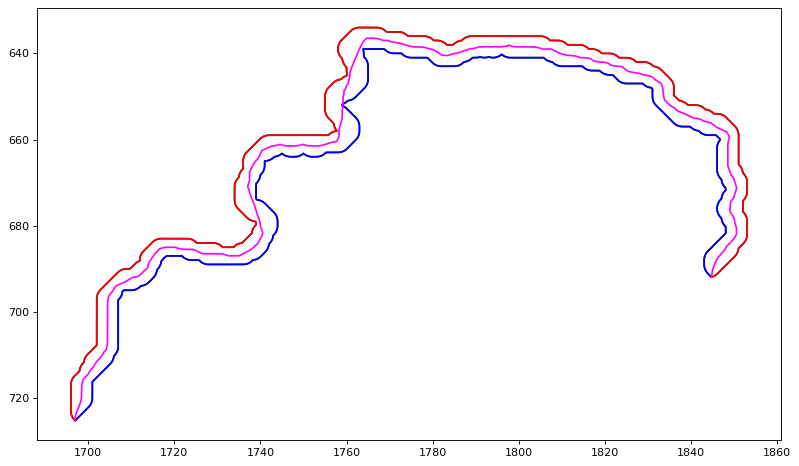

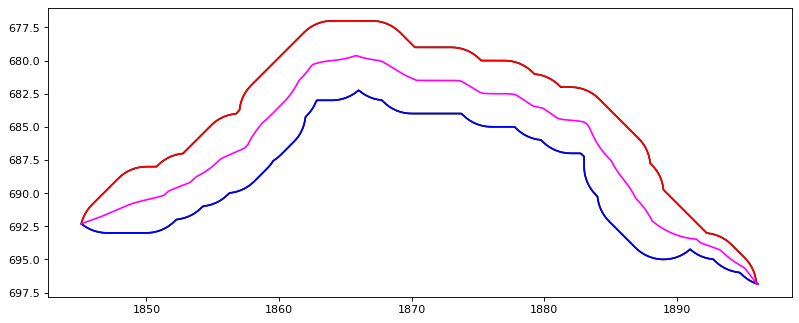

...

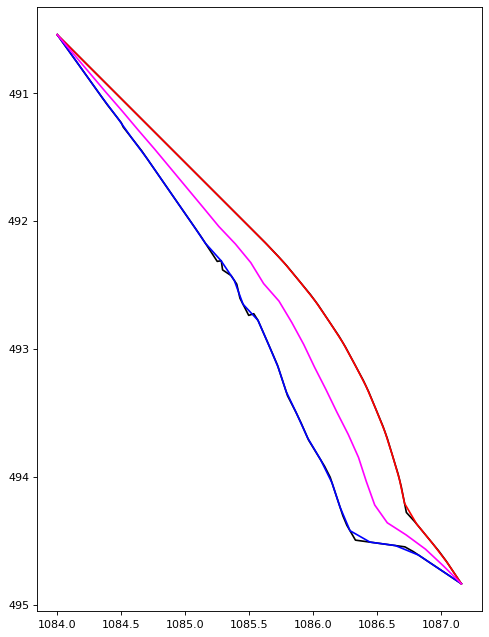

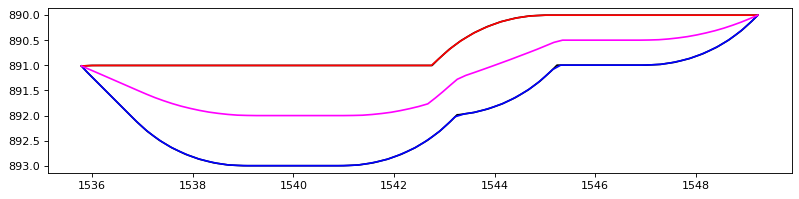

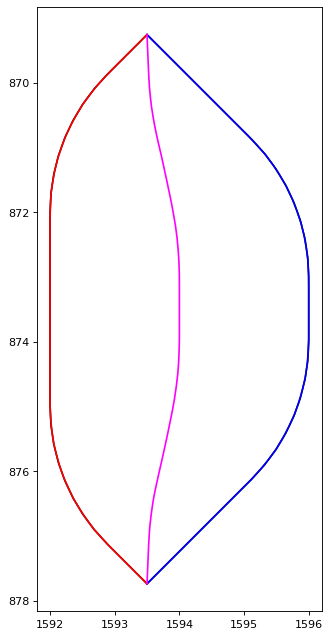

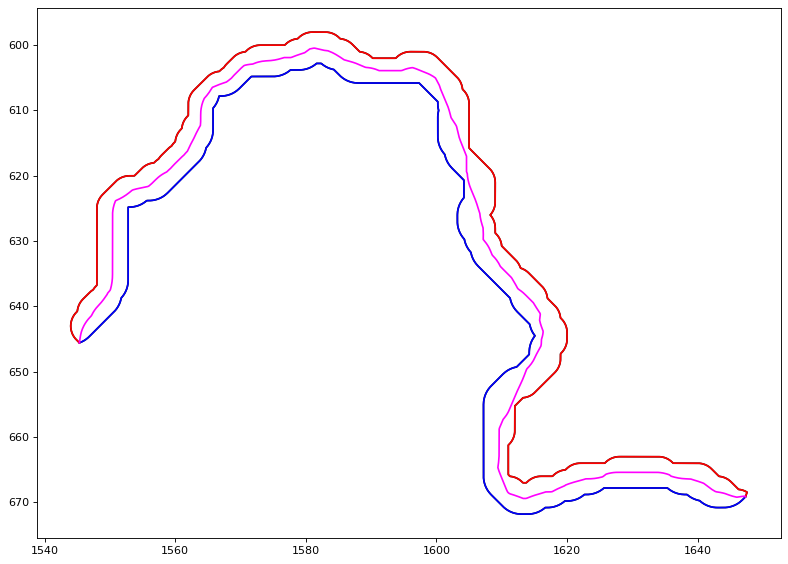

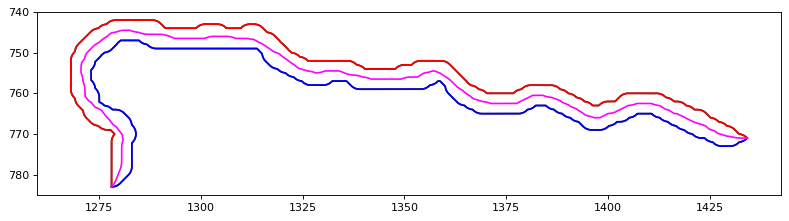

*** KeyboardInterrupt exception caught in code being profiled.

<Figure size 960x800 with 0 Axes>

In [93]:
%load_ext line_profiler
logs_for_profiling = {
    'intersections_generated' : 0,
    'intersections_too_small' : 0,
    'border_middle_tried' : 0,
    'border_middle_success' : 0,
    'border_middle_failed' : 0,
    'get_biggest_polygon_unsecure' : 0,
}
%lprun -f compute_border_middle solve_border_conflicts(europe_fat, [], logs_for_profiling)


In [66]:
import pandas as pd
from IPython.display import display, HTML

#drawPaul(*europe_fat[:10],  simplify=True)
err_list = []
logs_for_analysis = {
    'intersections_generated' : 0,
    'intersections_too_small' : 0,
    'border_middle_tried' : 0,
    'border_middle_success' : 0,
    'border_middle_failed' : 0,
    'get_biggest_polygon_unsecure' : 0,
}
try:
    europe_nice = solve_border_conflicts(europe_fat, err_list, logs_for_analysis)
except (KeyboardInterrupt, Exception) as e:
    display(pd.DataFrame.from_records(err_list))
    display(pd.DataFrame.from_records([logs_for_analysis]))
    print('Analysis interrupted')
    raise e

removed 14 that were contained


TopologyException: found non-noded intersection between LINESTRING (1329.7 450.232, 1328.77 452.479) and LINESTRING (1328.77 452.479, 1328.77 452.479) at 1328.7685505331799 452.47895185281203


TopologyException: found non-noded intersection between LINESTRING (1023.27 733.273, 1023.27 733.275) and LINESTRING (1023.27 733.275, 1023.09 733.565) at 1023.268353634693 733.27479211581488


TopologyException: found non-noded intersection between LINESTRING (1469.59 40.8336, 1468.47 39.7102) and LINESTRING (1469.59 40.8336, 1468.15 39.3888) at 1468.5093401646939 39.748843596911122


TopologyException: Input geom 1 is invalid: Self-intersection at or near point 994.20276407997926 607.12260413227034 at 994.20276407997926 607.12260413227034


,message,to_be_reduced_polygon,conflicting_polygon,intersection,dilated_territory_polygon,territory_already_reduced_polygon
0,Extremities has length : 4,"POLYGON ((842.8256616109045 1070.988298049248,...","POLYGON ((839.7448232847248 1068.015673283058,...","POLYGON ((842.8256616109045 1070.988298049248,...",NaN,NaN
1,Extremities has length : 4,"POLYGON ((1331.69243927627 828.9123743220514, ...","POLYGON ((1264.003137254902 769.8226575571985,...","POLYGON ((1345.998805033079 816.2383084652963,...",NaN,NaN
2,Extremities has length : 4,"POLYGON ((1238.1915888407 541.633781183018, 12...","POLYGON ((1177.269875286156 602.726729535648, ...","POLYGON ((1177.77466330585 593.8805094232411, ...",NaN,NaN
3,Extremities has length : 4,"POLYGON ((1137.014373111459 692.2287111143913,...","POLYGON ((1122.268568599686 651.2798396208449,...","POLYGON ((1150.582138451002 642.1492067458333,...",NaN,NaN
4,Extremities has length : 4,"POLYGON ((1136.922689162325 718.0031372549018,...","POLYGON ((1024.2 731.6440302102797, 1024.2 732...","POLYGON ((1066.752809903913 724.790335846595, ...",NaN,NaN
5,Extremities has length : 4,"POLYGON ((1081.996862745098 786.8225971137281,...","POLYGON ((1075.003137254902 723.7573593128808,...","POLYGON ((1108.808405976832 772.0365243157522,...",NaN,NaN
6,Extremities has length : 4,"POLYGON ((1081.996862745098 786.8225971137281,...","POLYGON ((1092.960770297348 736.8074142913532,...","POLYGON ((1108.808405976832 772.0365243157522,...",NaN,NaN
7,Could not split polygon perimeter on first cut,"POLYGON ((1156.996862745098 753.2426406871192,...","POLYGON ((1082.408805870381 725.5, 1082.357373...","POLYGON ((1120.996862745098 735.3749406809651,...",NaN,NaN
8,Error only one extremity,"POLYGON ((1156.996862745098 753.2426406871192,...","POLYGON ((1082.003137254902 727.7573593128808,...","POLYGON ((1151 748.003137254902, 1151.29405142...",NaN,NaN
9,Intersection boundary is multilinestring,"POLYGON ((1156.996862745098 753.2426406871192,...","POLYGON ((1028.015964712883 711.7445318548995,...","POLYGON ((1138.567364243912 721.6721391883052,...",NaN,NaN


,intersections_generated,intersections_too_small,border_middle_tried,border_middle_success,border_middle_failed,get_biggest_polygon_unsecure
0,4064,1216,2848,2797,51,1


Analysis interrupted


In [ ]:
start = min([t.start.year for t in europe_nice])
end = max([t.end.year for t in europe_nice] )
years_to_display = np.ra
drawPaul(*europe_nice[:10], *[(LineString(t.polygon.exterior.coords), [0,0,0]) for t in europe_nice[:10]])

In [ ]:
with open('pola.wkt', 'r') as f:
    polygon_to_cut_pb = shapely.wkt.loads(f.read())
with open('intersection.wkt', 'r') as f:
    intersection_pb = shapely.wkt.loads(f.read())
with open('polb.wkt', 'r') as f:
    polb_pb = shapely.wkt.loads(f.read())
with open('midSeg.wkt', 'r') as f:
    midSeg_pb = shapely.wkt.loads(f.read())
extremities = polb_pb.boundary.intersection(polygon_to_cut_pb.boundary).intersection(intersection_pb.buffer(1e-10))
extremities_wthout_intersection = polb_pb.boundary.intersection(polygon_to_cut_pb.boundary)
#print('len extremities without intersection ; ', len(extremities_wthout_intersection))
print('intersection bounds : ', intersection_pb.bounds)
print('pola bounds', polygon_to_cut_pb.bounds)
print('polb bounds', polb_pb.bounds)
print('once cut with intersection : ', extremities_wthout_intersection.intersection(intersection_pb))
print('once cut with buffered intersection : ', extremities_wthout_intersection.intersection(intersection_pb.buffer(1e-3)))
drawPaul((polygon_to_cut_pb.boundary, 'blue'), (intersection_pb, 'yellow'),(extremities_wthout_intersection, 'green'), (polb_pb.boundary, 'red'), (extremities, 'black'))
print('intersection of pola and polb boundary : ', extremities_wthout_intersection)
print('intersection of pola and polb lying in yellow area', extremities)

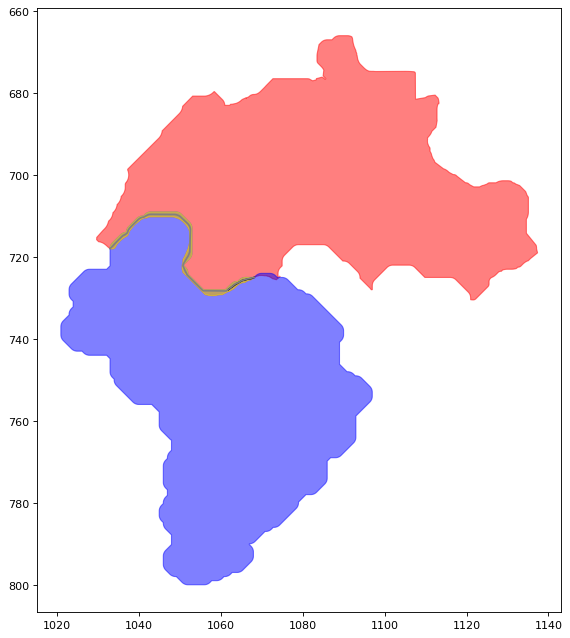

In [109]:
with open('pola.wkt', 'r') as f:
    polygon_to_cut_pb = shapely.wkt.loads(f.read())
with open('intersection.wkt', 'r') as f:
    intersection_pb = shapely.wkt.loads(f.read())
with open('polb.wkt', 'r') as f:
    polb_pb = shapely.wkt.loads(f.read())
with open('midSegA.wkt', 'r') as f:
    midSegA_pb = shapely.wkt.loads(f.read())
with open('midSegB.wkt', 'r') as f:
    midSegB_pb = shapely.wkt.loads(f.read())
drawPaul((polygon_to_cut_pb, 'red'), (polb_pb, 'blue'), (intersection_pb, 'yellow'), (midSegA_pb, 'black'), (midSegB_pb, 'gray'))